# Differentiable Forwards Modelled Interferrometry

This little tutorial is designed to give an overview of how to forwards-model fit interferrometric observables directly to data, including aberratios and detector effects.

In [1]:
import os
os.environ["XLA_FLAGS"] = '--xla_force_host_platform_device_count=2'

import jax
import jax.numpy as np
import dLux as dl
import dLux.utils as dlu

jax.config.update("jax_enable_x64", True)

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = 'lower'
plt.rcParams['figure.dpi'] = 120

In [2]:
# from lib import get_files, summarise_files

# # Bind file path, type and exposure type
# file_fn = lambda **kwargs: get_files(
#     "/Users/louis/Data/JWST/COM1093/stage2/",
#     "cal",
#     EXP_TYPE="NIS_AMI",
#     PATTTYPE="NONE",
#     **kwargs,
# )

# stars = ["AB-DOR", "HD-37093", "HD-36805"]

# files = []
# for star in stars:
#     fs = file_fn(TARGPROP=star)
#     print(f"\n{len(fs)}")
#     summarise_files(fs, ["ACT_ID"])
#     files += fs

# print(f"\n{len(files)}")
# summarise_files(files, ["ACT_ID", "NGROUPS", "NINTS", "DURATION"])

In [3]:
from lib import get_files, summarise_files

# Bind file path, type and exposure type
file_fn = lambda **kwargs: get_files(
    "/Users/louis/Data/JWST/COM1093/stage2/",
    "cal",
    EXP_TYPE="NIS_AMI",
    PATTTYPE="NONE",
    # FILTER="F480M",
    OBSERVTN=["013", "016", "019"],
    **kwargs,
)

stars = ["AB-DOR", "HD-37093", "HD-36805"]

files = []
for star in stars:
    fs = file_fn(TARGPROP=star)
    print(f"\n{len(fs)}")
    summarise_files(fs, ["ACT_ID"])
    files += fs

# files = files[-1:]

print(f"\n{len(files)}")
summarise_files(files, ["ACT_ID", "NGROUPS", "NINTS", "DURATION"])


4
  TARGPROP: AB-DOR
  TARGNAME: HD 36705
  FILTER: F380M, F480M, F430M
  OBSERVTN: 013
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: NIS
  DATAMODL: ImageModel
  INSTRUME: NIRISS
  EXP_TYPE: NIS_AMI
  ACT_ID: 04, 03, 05, 02

3
  TARGPROP: HD-37093
  TARGNAME: HD 37093
  FILTER: F380M, F480M, F430M
  OBSERVTN: 016
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: NIS
  DATAMODL: ImageModel
  INSTRUME: NIRISS
  EXP_TYPE: NIS_AMI
  ACT_ID: 04, 03, 02

3
  TARGPROP: HD-36805
  TARGNAME: HD 36805
  FILTER: F380M, F480M, F430M
  OBSERVTN: 019
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: NIS
  DATAMODL: ImageModel
  INSTRUME: NIRISS
  EXP_TYPE: NIS_AMI
  ACT_ID: 04, 03, 02

10
  TARGPROP: HD-37093, HD-36805, AB-DOR
  TARGNAME: HD 36805, HD 37093, HD 36705
  FILTER: F380M, F480M, F430M
  OBSERVTN: 016, 019, 013
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: 

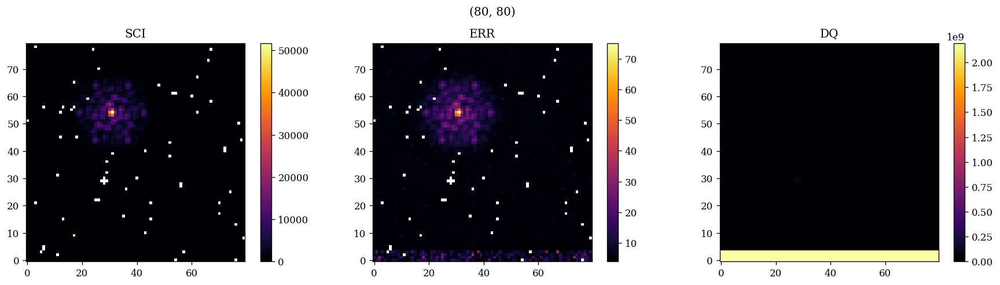

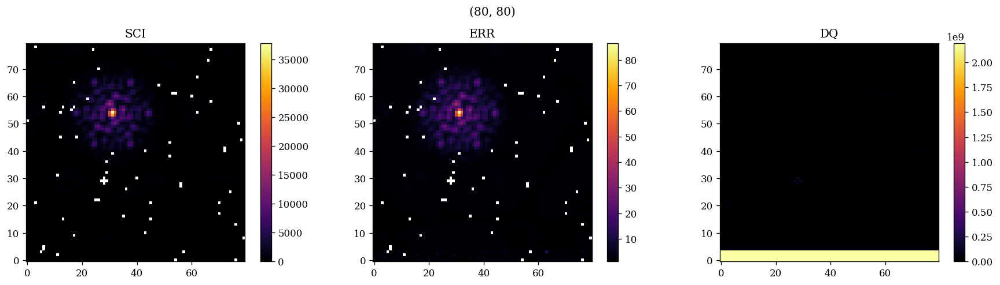

In [4]:
from lib import plot_image

for file in files[:2]:
    plot_image(file, 0)

In [5]:
from jax import lax


def FIM(pytree, parameters, loglike_fn, *loglike_args, shape_dict={}, **loglike_kwargs):
    # Build X vec
    pytree = zdx.tree.set_array(pytree, parameters)
    shapes, lengths = zdx.bayes._shapes_and_lengths(pytree, parameters, shape_dict)
    X = np.zeros(zdx.bayes._lengths_to_N(lengths))

    # Build function to calculate FIM and calculate
    @jax.hessian
    def calc_fim(X):
        parametric_pytree = _perturb(X, pytree, parameters, shapes, lengths)
        return loglike_fn(parametric_pytree, *loglike_args, **loglike_kwargs)

    return calc_fim(X)


def _perturb(X, pytree, parameters, shapes, lengths):
    n, xs = 0, []
    if isinstance(parameters, str):
        parameters = [parameters]
    indexes = range(len(parameters))

    for i, param, shape, length in zip(indexes, parameters, shapes, lengths):
        if length == 1:
            xs.append(X[i + n])
        else:
            xs.append(lax.dynamic_slice(X, (i + n,), (length,)).reshape(shape))
            n += length - 1

    return pytree.add(parameters, xs)

In [6]:
import optax


# TODO: Add an optional 'norm_fn' that normalises the model as desired
# Maybe a process_grads fn too for fixing params?
def fit_image(
    tel,
    file,
    loss_fn,
    support,
    epochs,
    params,
    optimisers,
    starts,
    loss_scale=1e-4,
    verbose=True,
    print_grads=False,
):
    im = np.array(file[1].data).astype(float)
    err = np.array(file[2].data).astype(float)

    model = initialise_for_data(tel, file)
    optim, opt_state = zdx.get_optimiser(model, params, optimisers)

    loss, grads = loss_fn(model, im, err, support)
    if print_grads:
        for param in params:
            print(f"{param}: {grads.get(param)}")
    losses, models_out = [], [model]

    if verbose:
        looper = tqdm(range(epochs), desc="Loss %.2f" % (loss * loss_scale))
    else:
        looper = range(epochs)

    for i in looper:
        # calculate the loss and gradient
        new_loss, grads = loss_fn(model, im, err, support)
        if new_loss > loss:
            print(
                f"Loss increased from {loss * loss_scale} to {new_loss * loss_scale} "
                f"on {i} th epoch"
            )
        loss = new_loss
        if np.isnan(loss):
            raise ValueError(f"Loss is NaN on {i} th epoch")

        for param, start in zip(params, starts):
            if i < start:
                grads = grads.multiply(param, 0.0)

        # apply the update
        updates, opt_state = optim.update(grads, opt_state)
        model = zdx.apply_updates(model, updates)

        # TODO: Make this into a "norm fn" that allows users to specify
        # Re-normalise the source (weights and phases)
        # source = model.source
        # norm_weights = source.weights / source.weights.sum()
        # norm_phases = source.phases - source.phases[0]
        # norm_ampls = source.amplitudes / source.amplitudes[0]
        # norm_source = source.set(
        #     ["weights", "phases", "amplitudes"], [norm_weights, norm_phases, norm_ampls]
        # )
        # # norm_source = model.source.normalise()
        # model = model.set("source", norm_source)

        # save results
        models_out.append(model)
        losses.append(loss)

        if verbose:
            looper.set_description("Loss %.2f" % (loss * loss_scale))

    return losses, models_out

In [7]:
def planck(wav, T):
    h = 6.626e-34
    c = 3.0e8
    k = 1.38e-23
    a = 2.0 * h * c**2
    b = h * c / (wav * k * T)
    intensity = a / ((wav**5) * (np.exp(b) - 1.0))
    return intensity

Teffs = {
    'AB-DOR': 5280,
    'HD-37093': 4410,
    'HD-36805': 5040
}

In [10]:
import os

from lib import (
    get_webb_osys_fits,
    initialise_for_data,
    UVSource,
    get_AMI_splodge_mask,
    Null,
    loglike_fn,
    like_fn,
    Interpolator,
)

from lib import (
    compare,
    show_splodges,
    show_likelihoods,
    pairwise_vectors,
    plot_vis,
    get_nan_support,
)
from zodiax.experimental import serialise, deserialise
from nrm_analysis.misctools import mask_definitions


import zodiax as zdx
import dLuxWebbpsf as dlw
import numpy as onp

for file in tqdm(files):

    # Check for already fit
    head = file[0].header
    name = f"{head["TARGPROP"]}_{head["FILTER"]}_{head["OBSERVTN"]}_{head["ACT_ID"]}"
    print(f"Fitting: {name}")

    tdays = file[0].header["EXPEND"] - file[0].header["EXPSTART"]
    print(f"Total Exposure Time: {tdays * 24 * 60 * 60:.2f} sec")

    # if name + '.zdx' in os.listdir('files/models/'):
    #     print(f"Already fit {name}, skipping\n")
    #     continue

    inst, psf_fits = get_webb_osys_fits(file)

    # Get modelling wavelengths
    wls = np.array([psf_fits[0].header[f"WAVE{i}"] for i in range(9)])
    source_wgts = planck(wls, Teffs[head["TARGPROP"]])

    # Create unitary weights so we can get the filter weights
    poppy_source = {'wavelengths': onp.array(wls), 'weights': onp.ones_like(wls)}
    psf_fits = inst.calc_psf(source=poppy_source)
    filt = np.array([psf_fits[0].header[f"WGHT{i}"] for i in range(9)])

    # Get spectra
    spec = filt * source_wgts

    # Get the dLux object
    tel = dlw.NIRISS(
        filter=inst.filter,
        aperture=inst.aperturename,
        detector=inst.detector,
        pupil_mask=inst.pupil_mask,
        radial_orders=[0,1,2],
        AMI=True,
    )
    tel = tel.multiply("basis", 1e-9) # Normalise to nm

    # Update with the latest WFS data
    planes = inst.optsys.planes
    tel = tel.set("pupil.opd", np.array(planes[0].opd))
    tel = tel.set("aberrations.opd", np.array(planes[2].opd))

    # Make the AMI mask interpolatable
    tf = dl.CoordTransform((0.0, 0.0), 0.0, (1.0, 1.0), (0.0, 0.0))
    pupil_mask_layer = tel.pupil_mask
    tel = tel.set('pupil_mask', Interpolator(pupil_mask_layer, tf))

    # Add a 'background' detector layer to calibrate that
    new_det = tel.detector.insert_layer(('bg', dl.AddConstant(0.)), 5)
    new_det = new_det.set('bg.value', np.array(0.0))
    tel = tel.set('detector', new_det)

    # Remove Charge Diffusion and initialise for data
    tel = tel.set("ChargeDiffusion", Null())

    # Create a 'clean' telescope 
    # tel = tel.set(['aberrations', 'SIAF', 'IPC'], Null())
    tel = tel.set(['aberrations', 'SIAF'], Null())
    tel = initialise_for_data(tel, file)

    # Generate Mask
    mask_path = f"files/masks/{head['FILTER']}.npy"
    if os.path.exists(mask_path):
        print("Using cached mask")
        masks = np.load(mask_path)
    else:
        print("Generating mask")
        masks = get_AMI_splodge_mask(tel, wls, verbose=False)
        np.save(mask_path, masks)

    # Create source
    source = UVSource(wls, masks, flux=tel.flux, position=tel.position, weights=spec)
    model = tel.set("source", source)

    # Get support
    support, support_mask = get_nan_support(file, n_mask=25, order=1)

    # Define loss function
    params = [
        "position",
        "flux",
        'bg.value',

        "translation",
        "rotation",
        "compression",
        "shear",
        "coefficients",
        "amplitudes",
        "phases"
    ]

    @zdx.filter_jit
    @zdx.filter_value_and_grad(params)
    def loss_fn(model, data, err, support):
        return -loglike_fn(model, data, err, support).sum()

    # Evaluate
    print("Compiling")
    im = np.array(file[1].data).astype(float)
    err = np.array(file[2].data).astype(float)
    loss, grads = loss_fn(model, im, err, support)

    # for param in params:
    #     print(param)
    #     print(f"{grads.get(param)}")
    #     print(f"{grads.get(param) / model.get(param)}")
    #     print()

    # Check for nans in loss and grads
    # [print(v) for v in grads.get(params) + [loss]]
    isnan = [np.isnan(v).any() for v in grads.get(params) + [loss]]
    if any(isnan):
        print("NaNs in loss or grads. skipping")

        continue

    # Optimise
    optimisers = [
        optax.sgd(2e-10), # pos
        optax.sgd(2e6),   # flux
        optax.sgd(2e-4),   # bg
        
        optax.sgd(1e-3),   # translation
        optax.sgd(1e-10),   # rotation
        optax.sgd(2e-10),   # compression
        optax.sgd(1e-10),   # shear

        optax.sgd(1e-2),  # coeff
        optax.sgd(10e-8),  # ampl
        optax.sgd(1e-7),  # phase
    ]

    # starts = [
    #     0,   # pos
    #     5,   # flux
    #     10,  # translation
    #     10,  # rotation
    #     10,  # compression
    #     10,  # shear
    #     30,  # coeff
    #     50,  # ampl
    #     50,  # phase
    # ]

    # TODO: Clip step sizes by some pre-defined max value? Ie 0.5 pixels for pos, 1e5 for flux etc
    k = 3
    starts = [
        0,   # pos
        k,   # flux
        k,   # bg
        k,  # translation
        k,  # rotation
        k,  # compression
        k,  # shear
        k,  # coeff
        k,  # ampl
        k,  # phase
    ]

    print(f"Fitting...")
    try:
        # Optimisation
        losses, models_out = fit_image(
            model, file, loss_fn, support, 50, params, optimisers, starts
        )

        # Fisher information
        marg_params = ["position", "flux", "amplitudes", "phases"]

        print("Calculating Fisher Information...")
        llike_fn = lambda model: loglike_fn(model, im, err, support).sum()
        fim = FIM(models_out[-1], marg_params, llike_fn, shape_dict={})
    
    except ValueError as e:
        print("Value Error found, Skipping")
        continue

    # Get the params from each model
    params_out = {}
    for param in params:
        params_out[param] = [model.get(param) for model in models_out]

    serialise(f"files/models/{name}.zdx", models_out[-1])
    serialise(f"files/params/{name}.zdx", params_out)
    np.save(f"files/losses/{name}.npy", losses)
    np.save(f"files/fims/{name}", fim)

  0%|          | 0/10 [00:00<?, ?it/s]

Fitting: AB-DOR_F430M_013_03
Total Exposure Time: 30.93 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 276.27:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: AB-DOR_F480M_013_05
Total Exposure Time: 30.63 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 407.42:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: AB-DOR_F380M_013_04
Total Exposure Time: 36.21 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 291.56:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: AB-DOR_F480M_013_02
Total Exposure Time: 31.23 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 277.45:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: HD-37093_F430M_016_03
Total Exposure Time: 58.84 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 296.26:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: HD-37093_F380M_016_04
Total Exposure Time: 44.51 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 287.81:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: HD-37093_F480M_016_02
Total Exposure Time: 59.82 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 277.55:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: HD-36805_F430M_019_03
Total Exposure Time: 43.30 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 298.26:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: HD-36805_F380M_019_04
Total Exposure Time: 36.81 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 224.96:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...
Fitting: HD-36805_F480M_019_02
Total Exposure Time: 49.04 sec
Loading WFS data
Using cached mask
Compiling
Fitting...


Loss 378.71:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating Fisher Information...


Plotting: AB-DOR_F430M_013_03


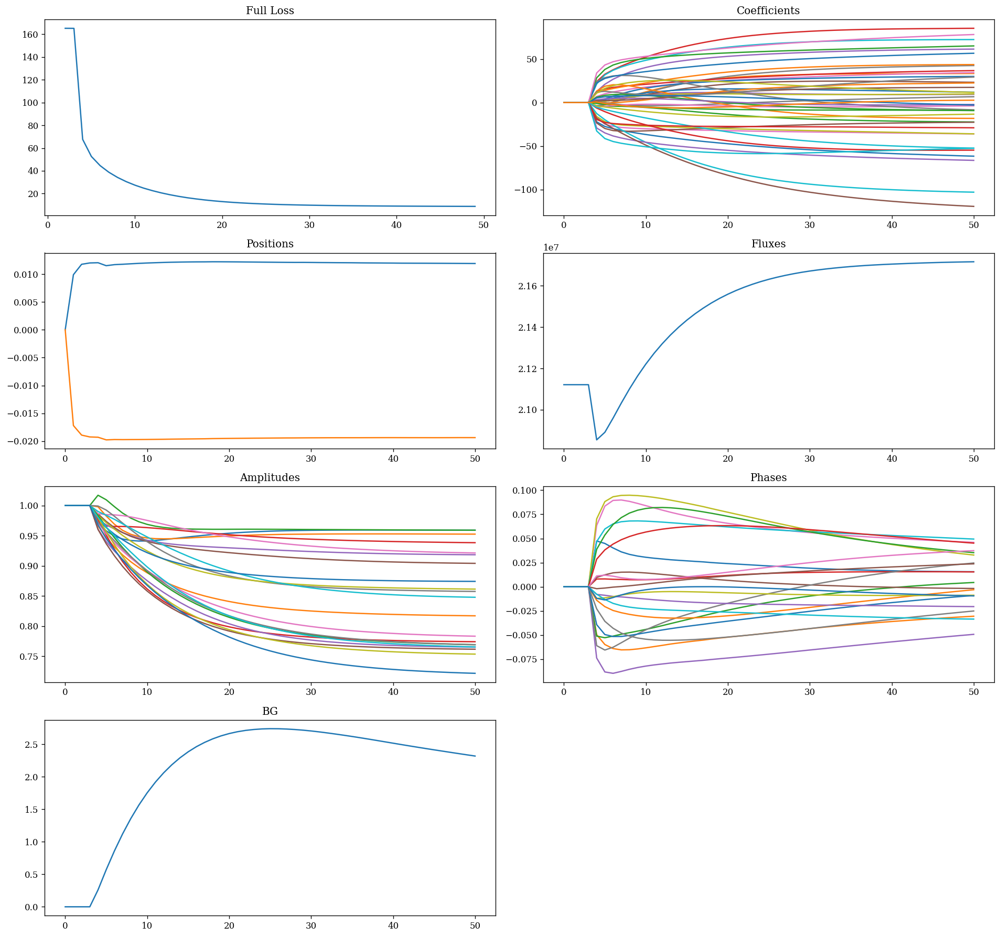

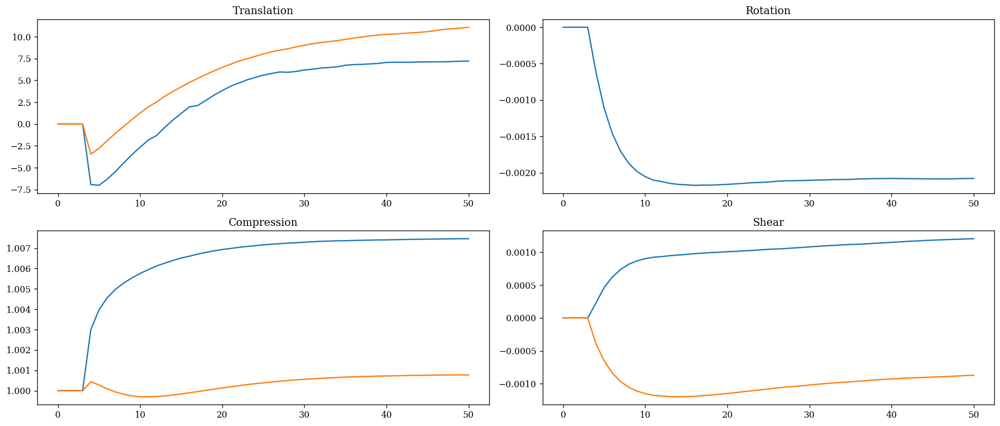

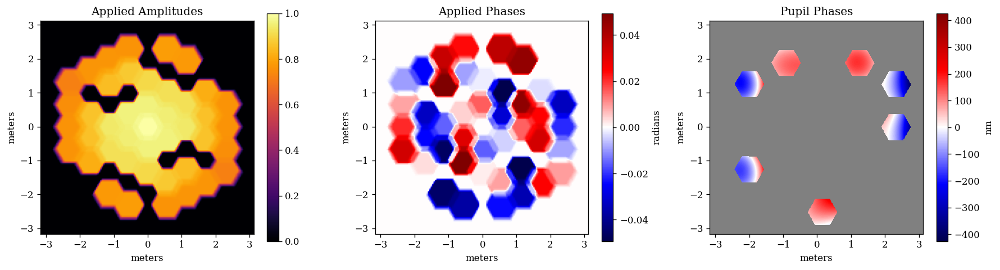

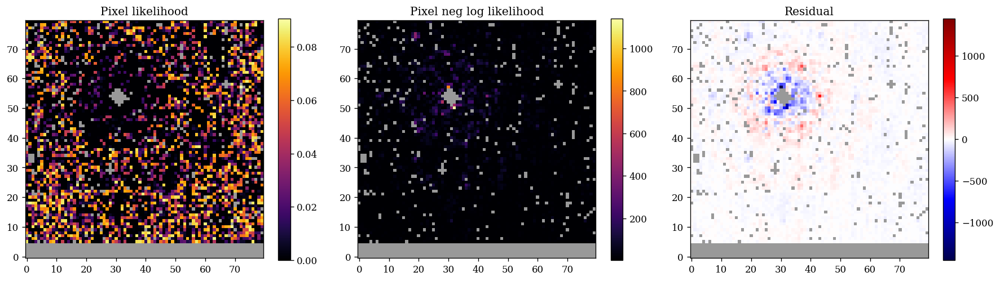

Plotting: AB-DOR_F480M_013_05


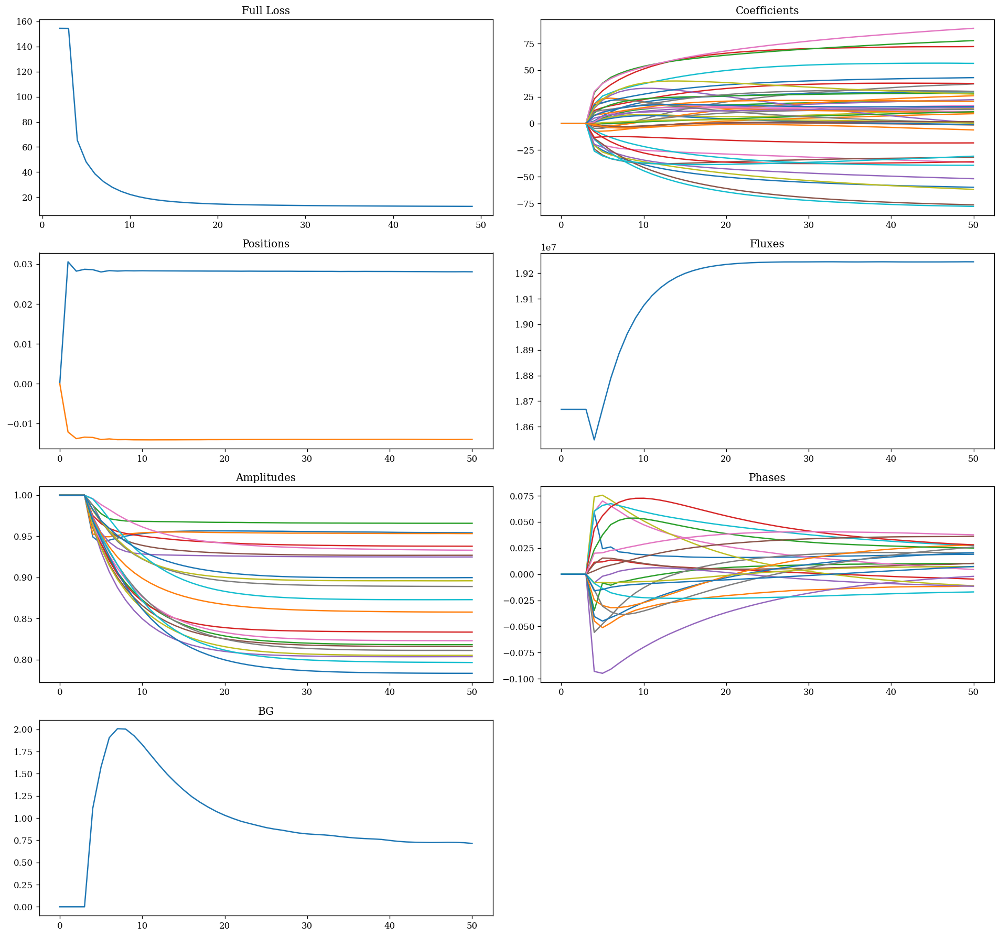

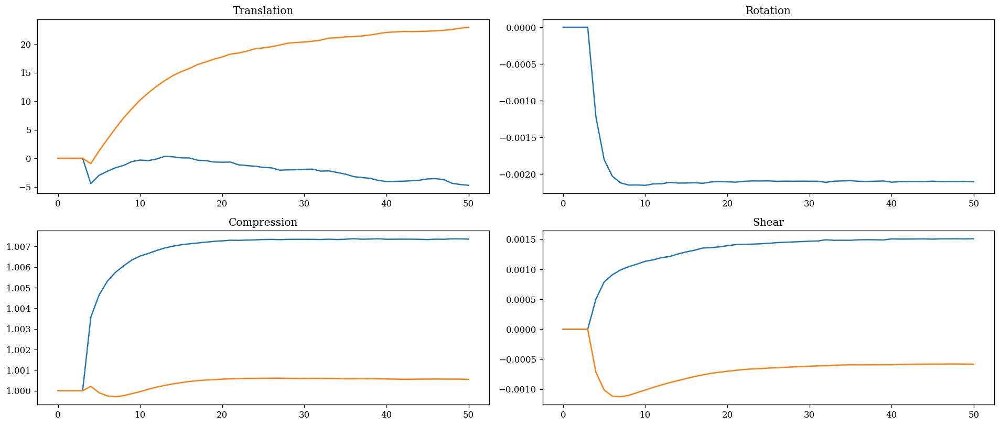

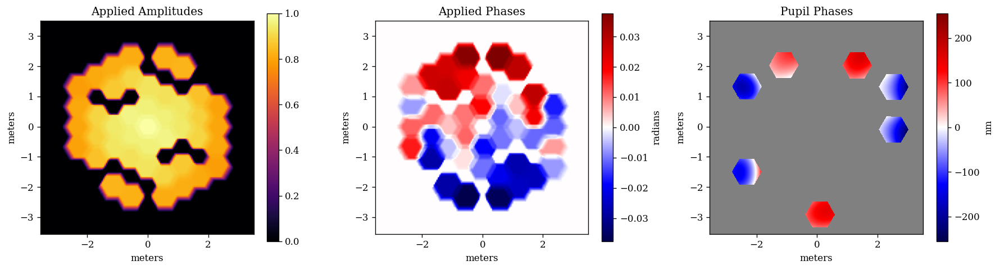

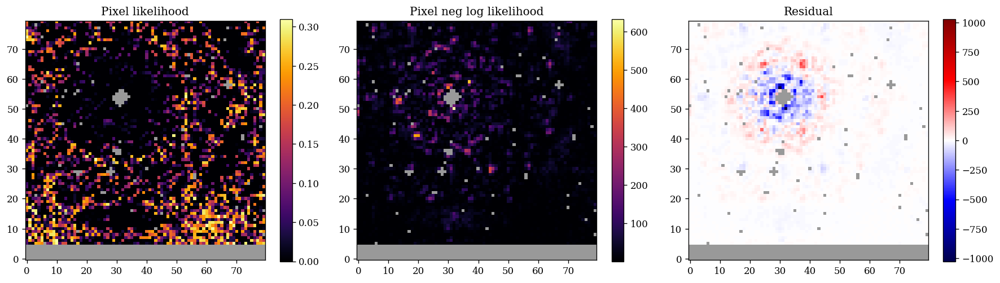

Plotting: AB-DOR_F380M_013_04


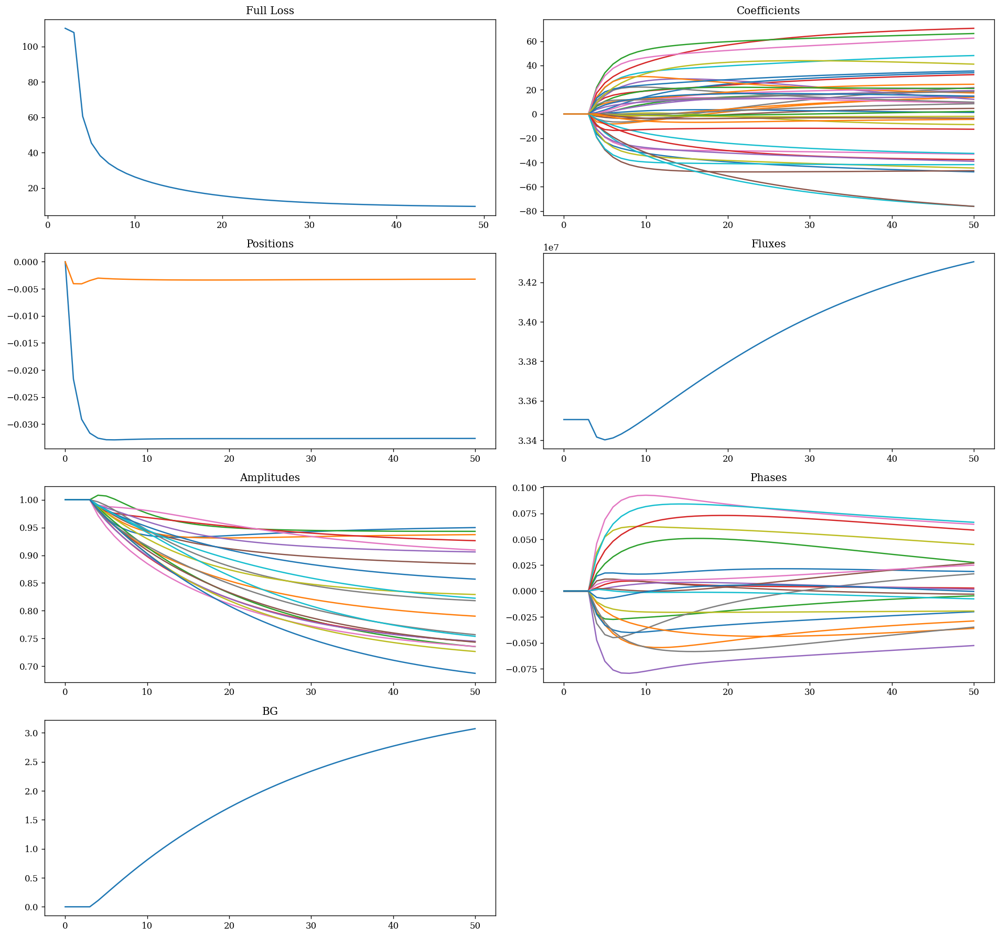

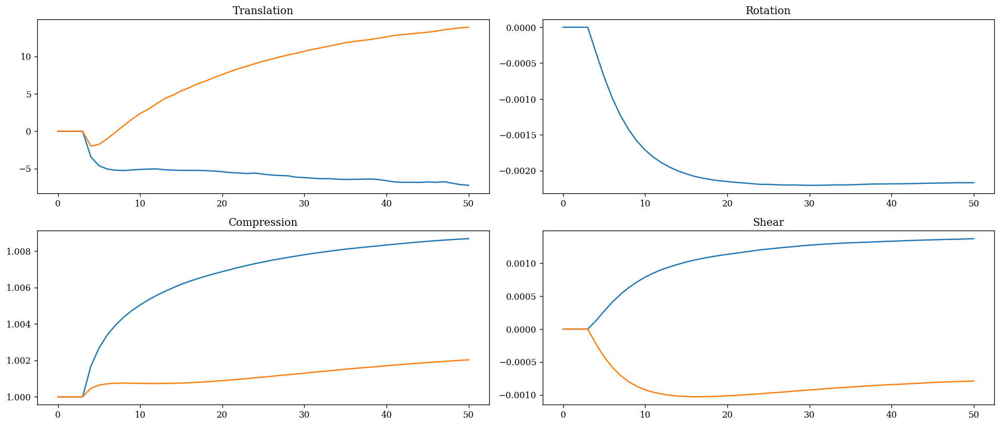

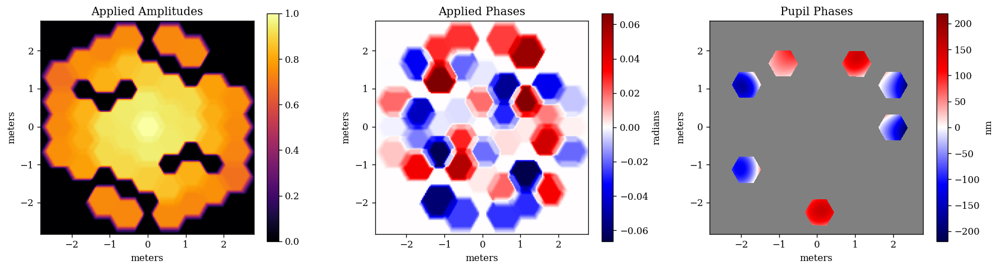

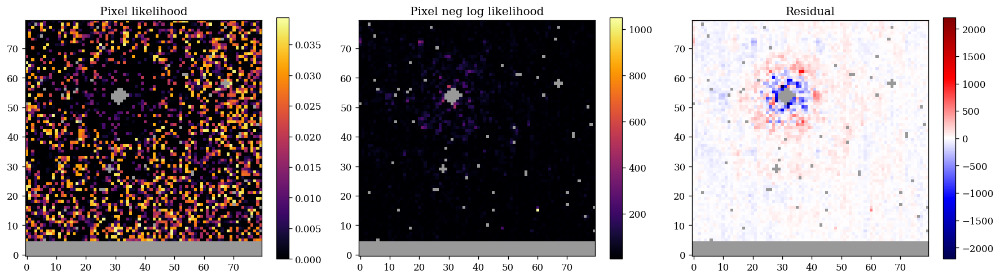

Plotting: AB-DOR_F480M_013_02


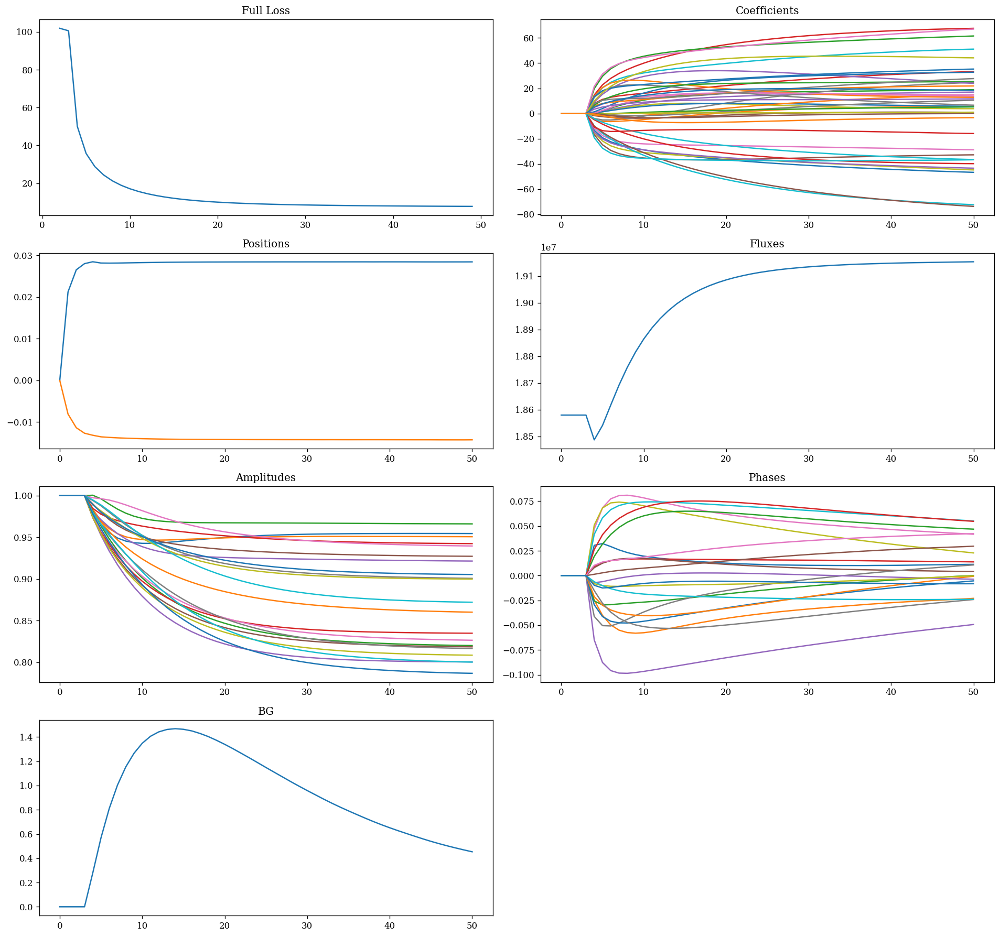

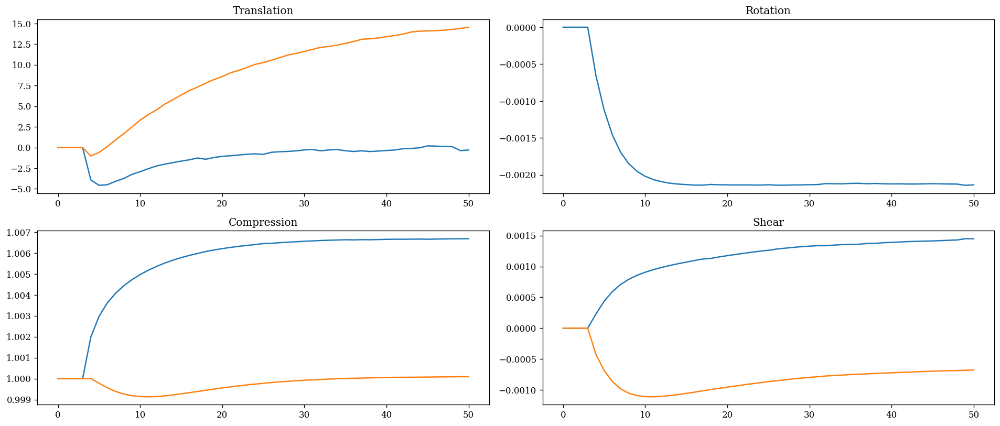

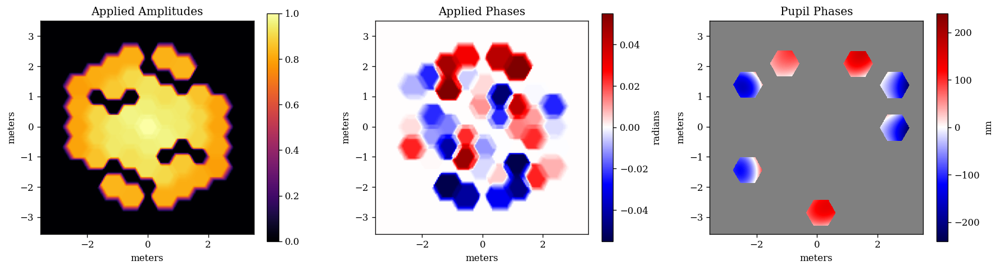

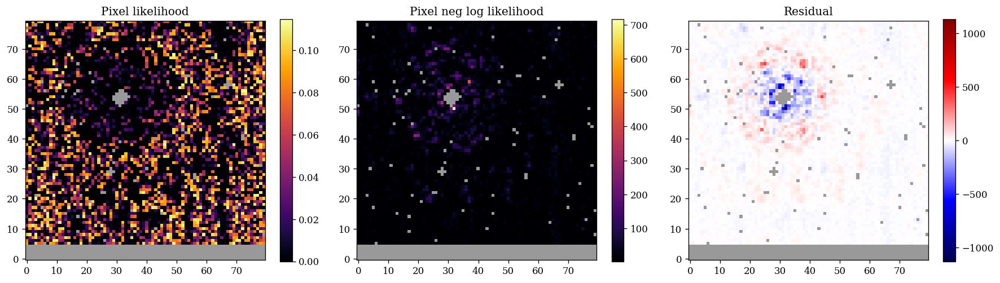

Plotting: HD-37093_F430M_016_03


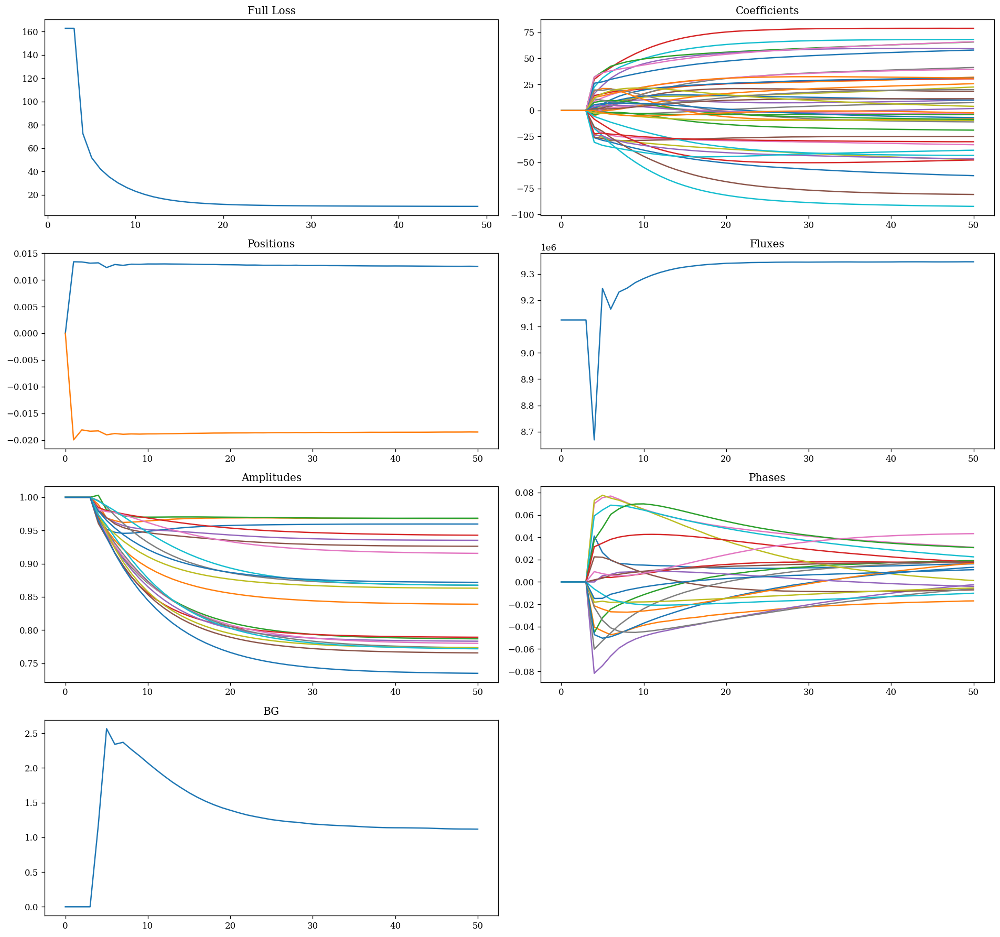

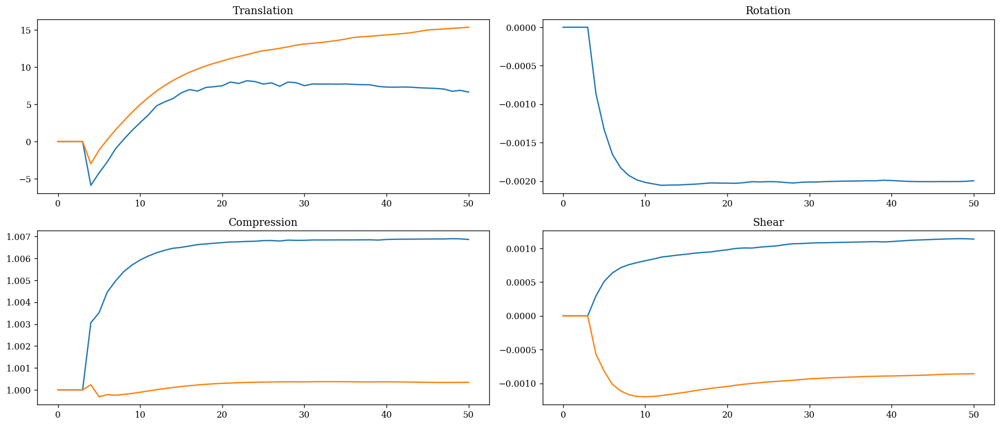

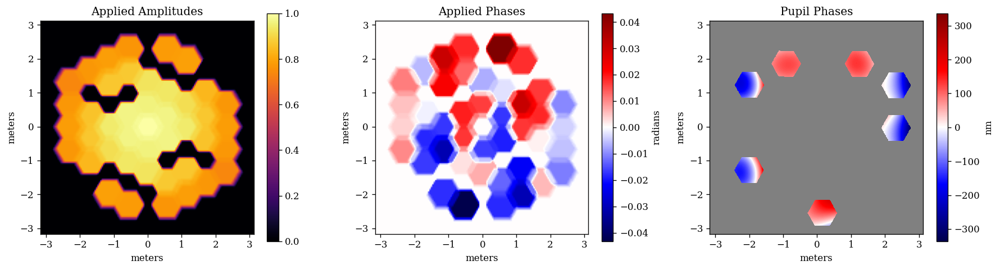

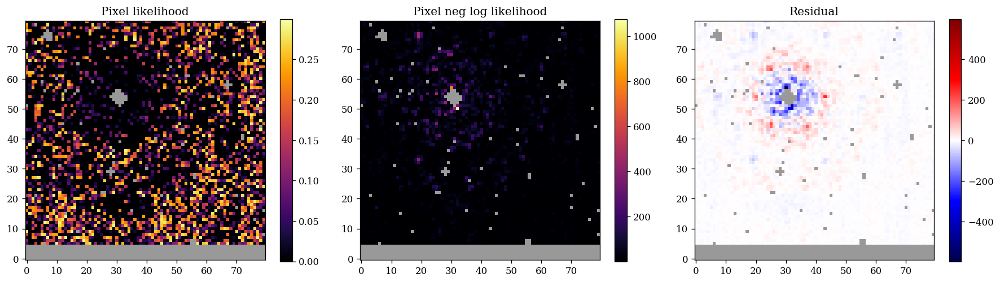

Plotting: HD-37093_F380M_016_04


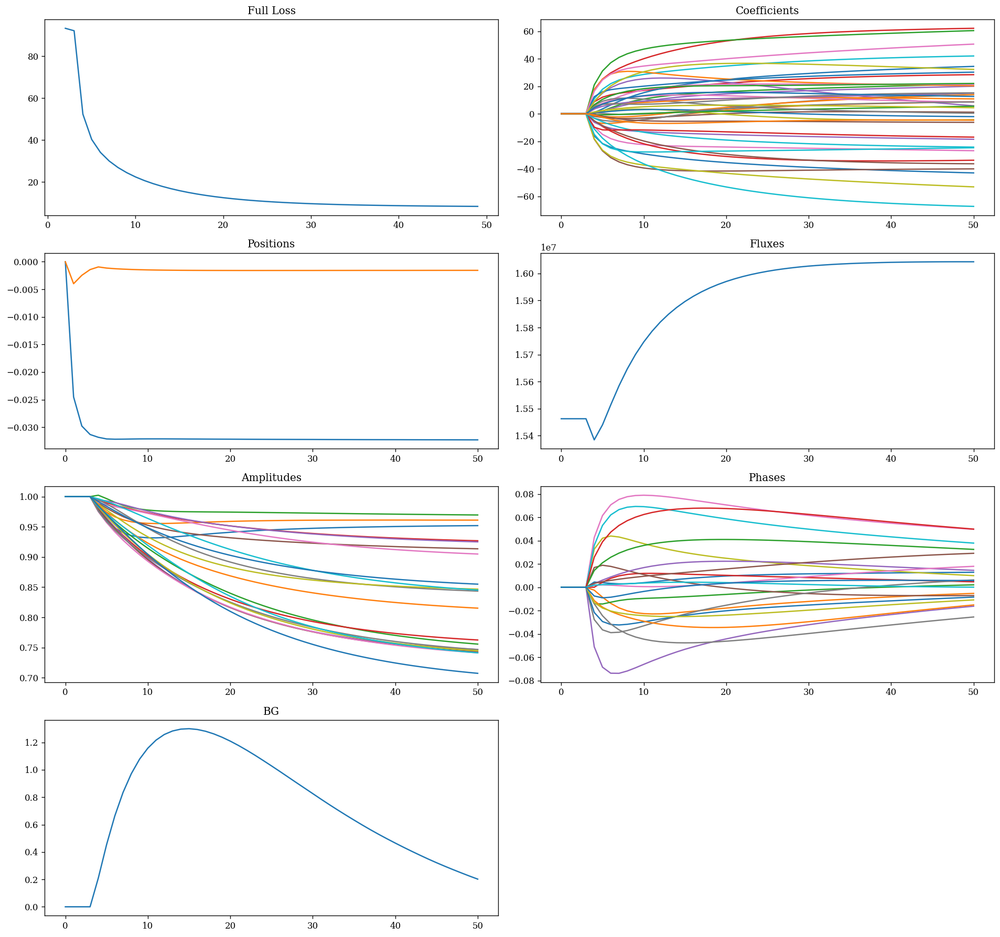

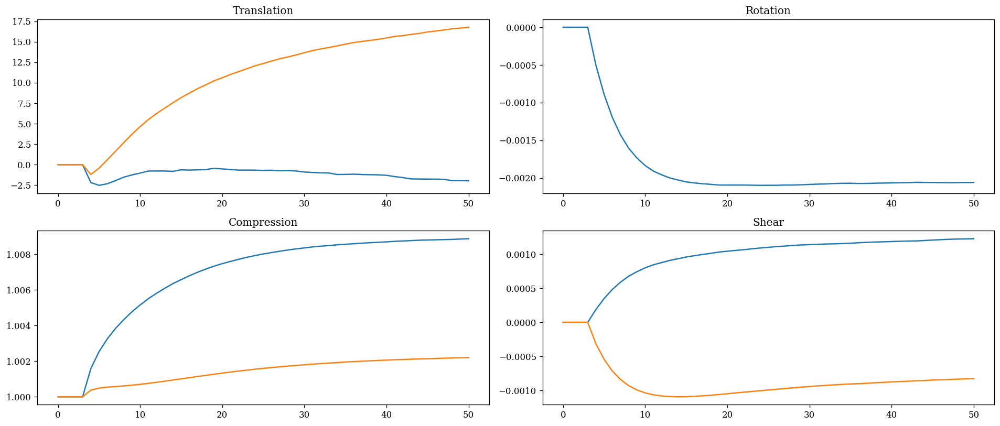

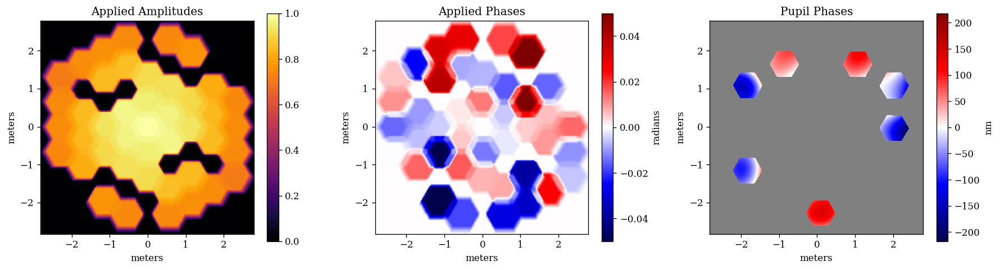

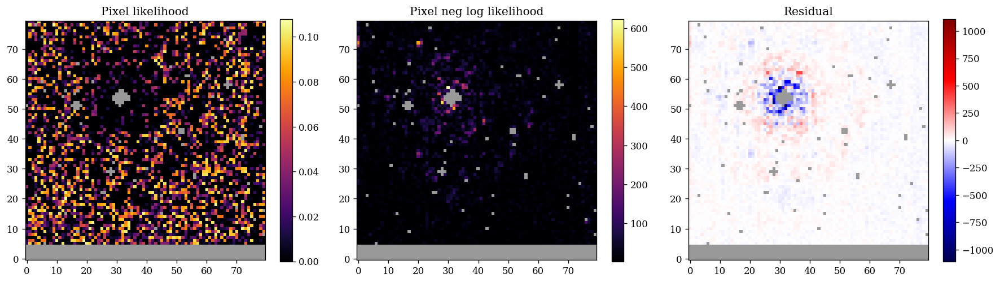

Plotting: HD-37093_F480M_016_02


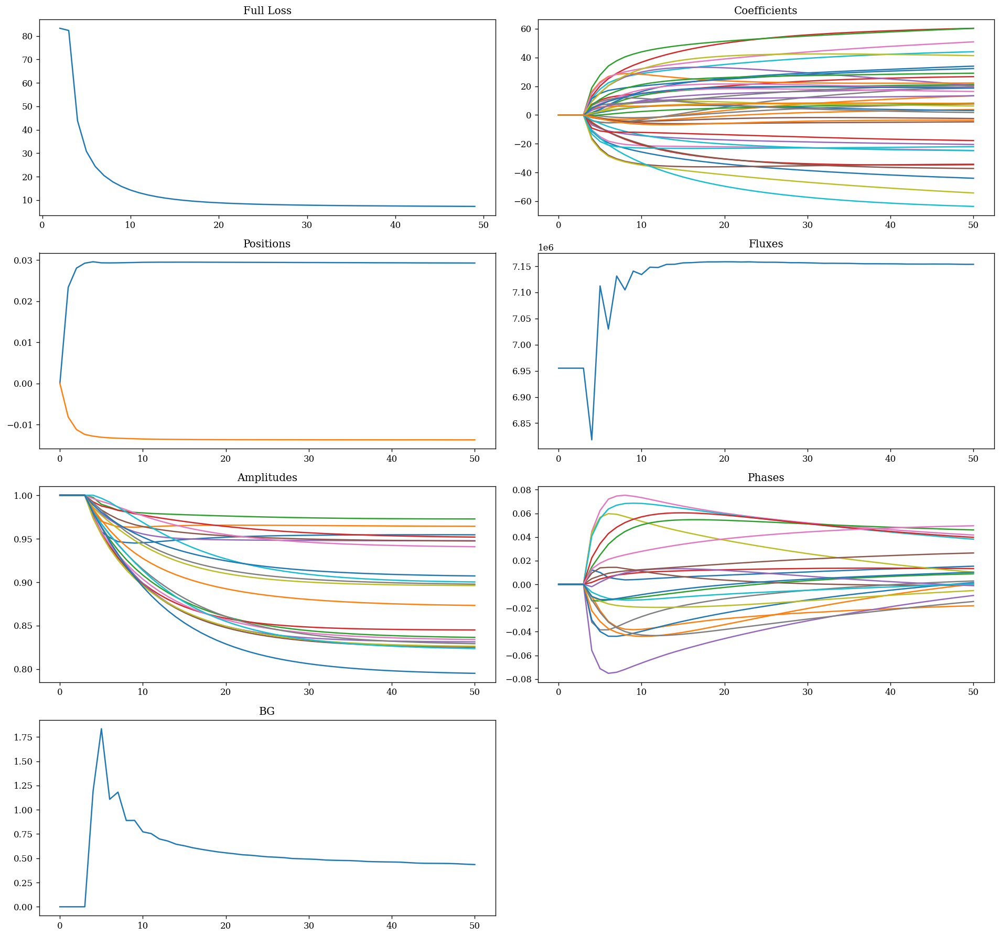

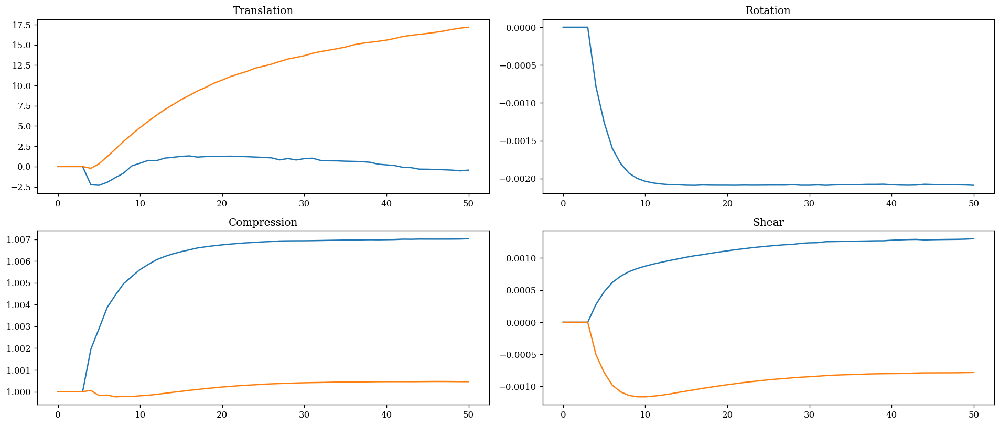

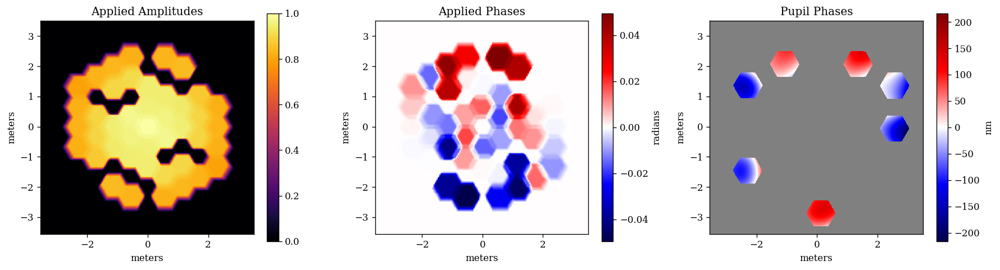

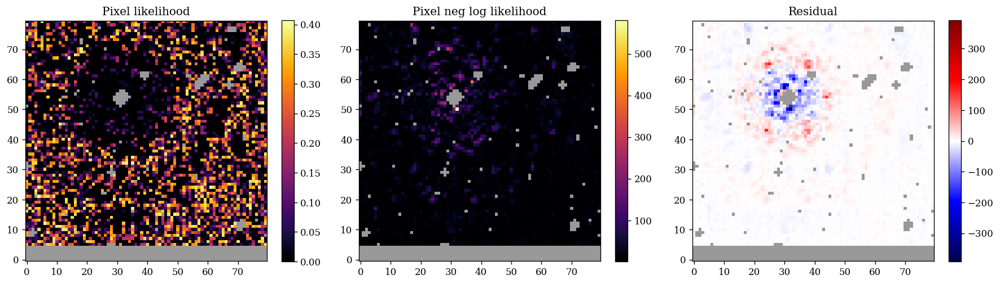

Plotting: HD-36805_F430M_019_03


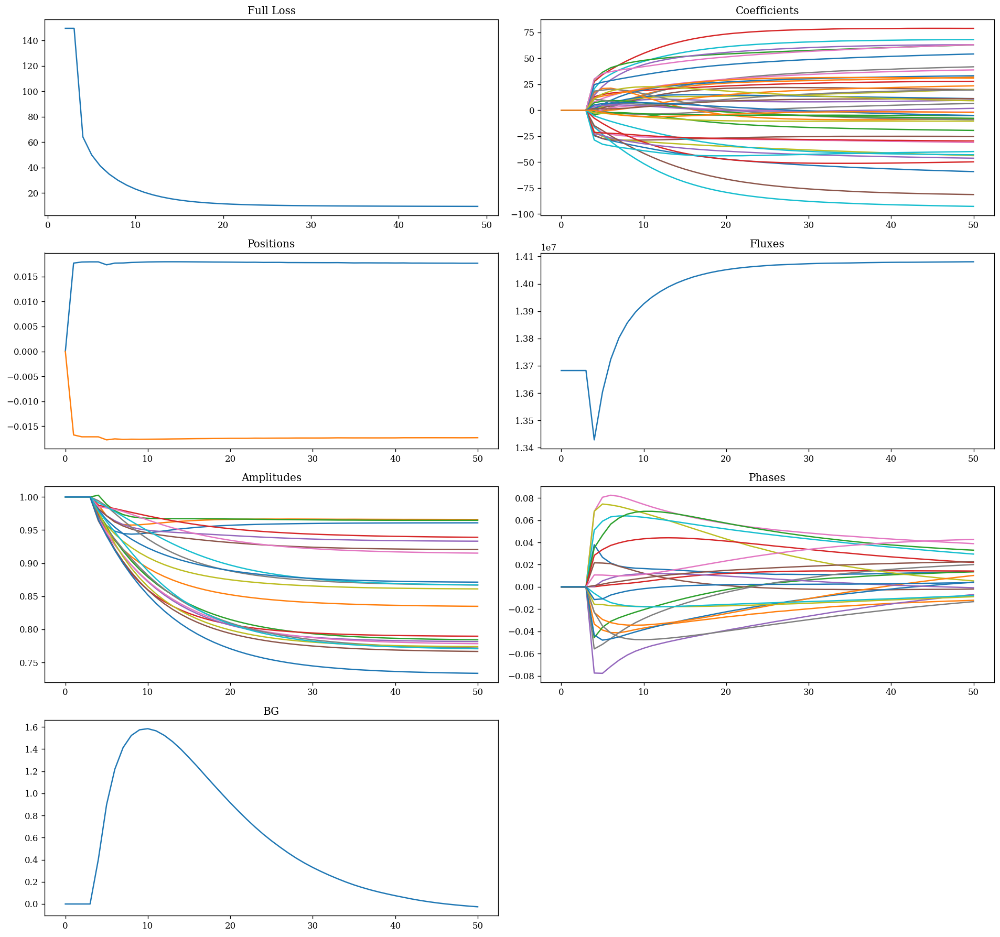

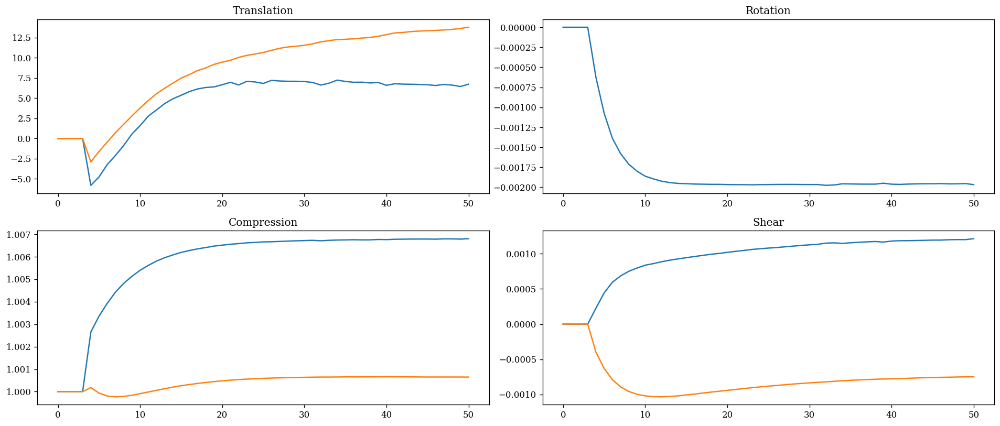

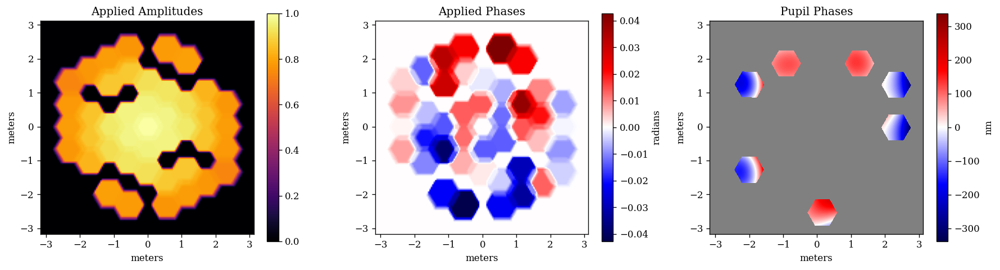

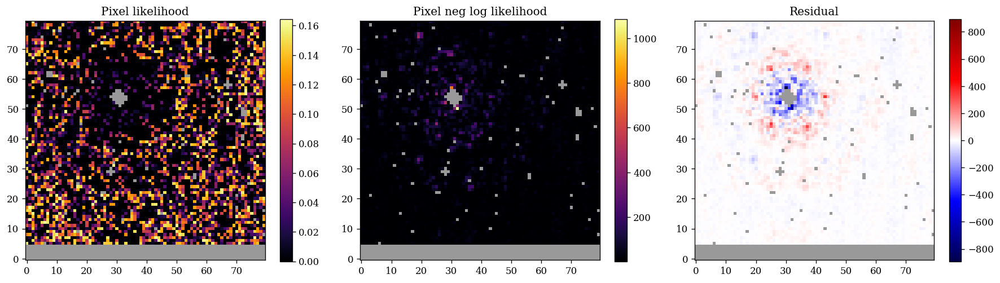

Plotting: HD-36805_F380M_019_04


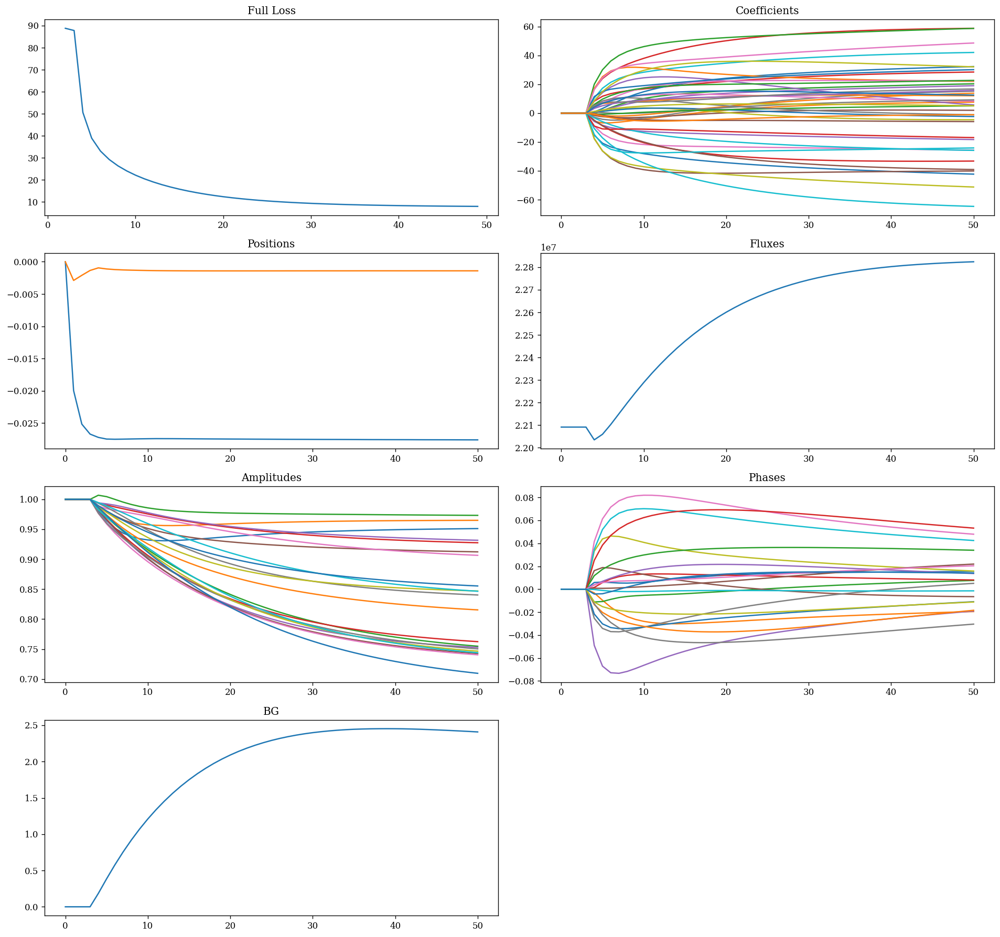

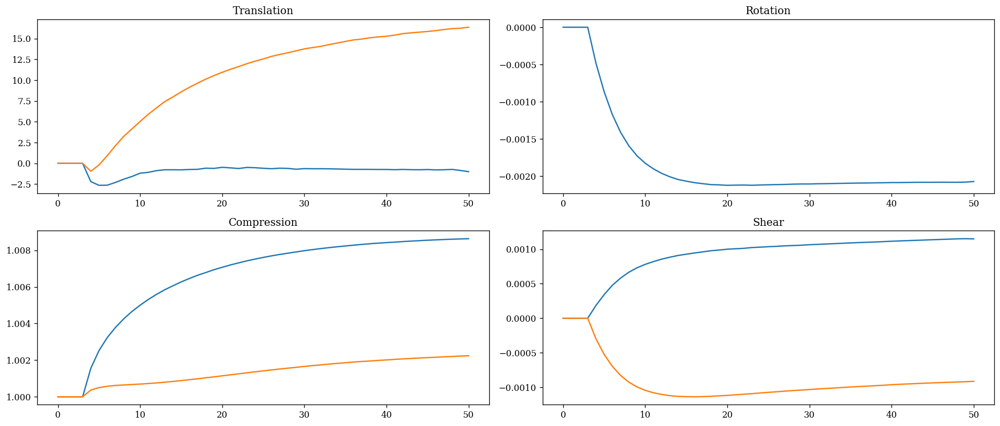

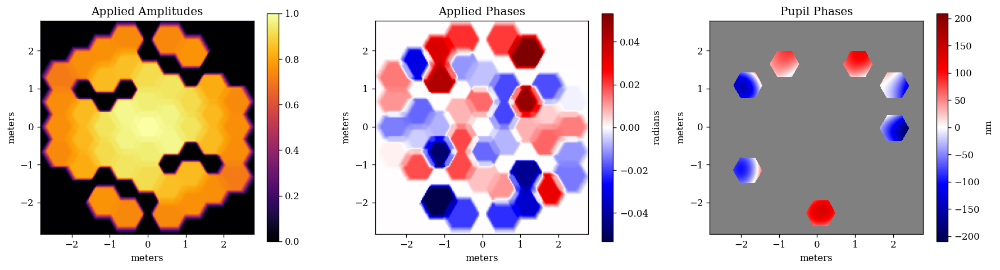

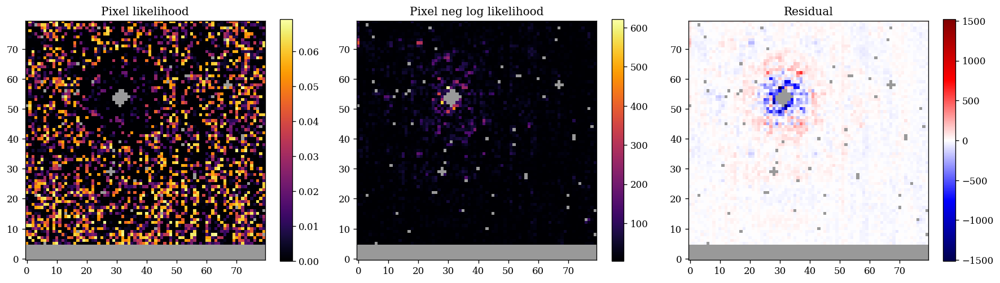

Plotting: HD-36805_F480M_019_02


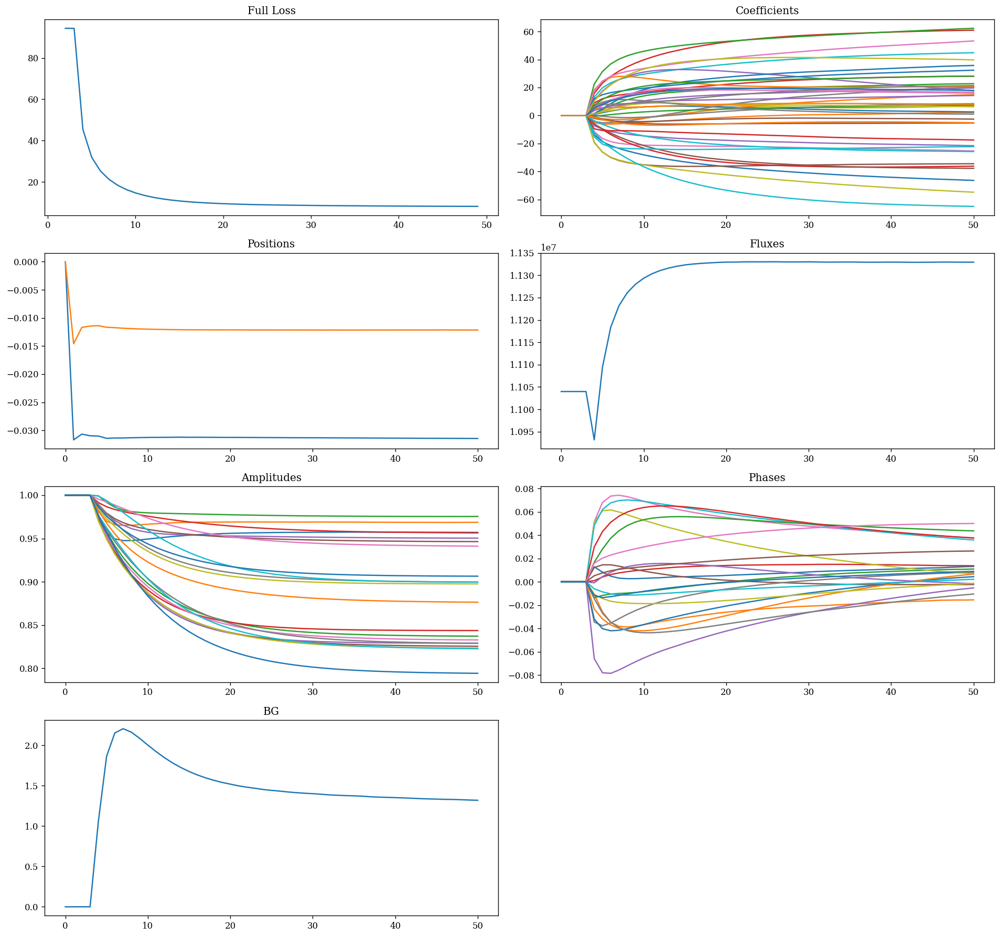

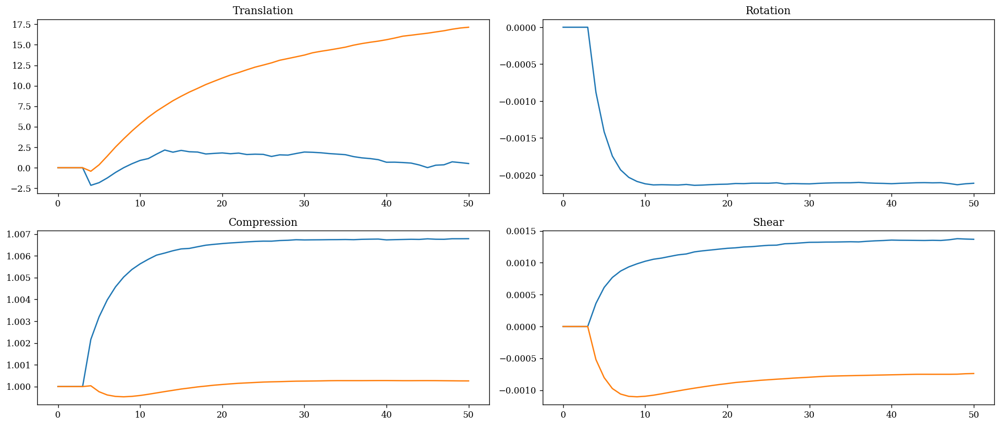

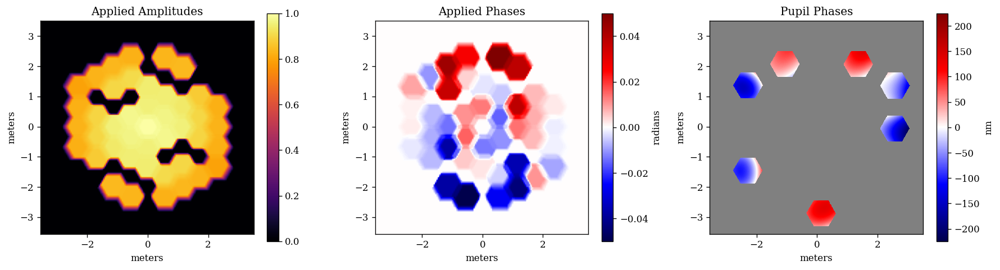

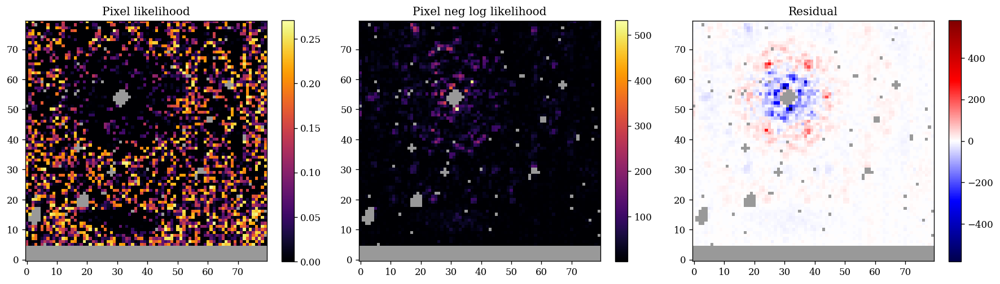

In [12]:

for file in files:
    head = file[0].header
    name = f"{head["TARGPROP"]}_{head["FILTER"]}_{head["OBSERVTN"]}_{head["ACT_ID"]}"
    print(f"Plotting: {name}")

    losses = 1e-4 * np.load(f"files/losses/{name}.npy")
    model = deserialise(f"files/models/{name}.zdx")
    params_out = deserialise(f"files/params/{name}.zdx")
    fim = np.load(f"files/fims/{name}.npy")

    k = 2
    plt.figure(figsize=(16, 15))
    plt.subplot(4, 2, 1)
    plt.title("Full Loss")
    plt.plot(np.arange(k, len(losses)), losses[k:])

    coeffs = np.array(params_out["coefficients"])
    plt.subplot(4, 2, 2)
    plt.title(f"Coefficients")
    plt.plot(coeffs.reshape(len(coeffs), -1))

    positions = np.array(params_out["position"])
    plt.subplot(4, 2, 3)
    plt.title("Positions")
    plt.plot(positions - positions[0])

    plt.subplot(4, 2, 4)
    plt.title("Fluxes")
    plt.plot(params_out["flux"])

    plt.subplot(4, 2, 5)
    plt.title("Amplitudes")
    plt.plot(params_out["amplitudes"])

    plt.subplot(4, 2, 6)
    plt.title("Phases")
    plt.plot(params_out["phases"])

    plt.subplot(4, 2, 7)
    plt.title("BG")
    plt.plot(params_out["bg.value"])

    plt.tight_layout()
    plt.show()


    plt.figure(figsize=(16, 10))
    plt.subplot(3, 2, 1)
    plt.title("Translation")
    plt.plot(params_out["translation"])

    plt.subplot(3, 2, 2)
    plt.title("Rotation")
    plt.plot(params_out["rotation"])

    plt.subplot(3, 2, 3)
    plt.title("Compression")
    plt.plot(params_out["compression"])

    plt.subplot(3, 2, 4)
    plt.title("Shear")
    plt.plot(params_out["shear"])

    plt.tight_layout()
    plt.show()

    show_splodges(model, s=75, pupil_phases=True)
    show_likelihoods(model, file, n_mask=3, order=2, k=0.4)
    # show_likelihoods(model, file, n_mask=0, order=2, k=0.4)

    # im = np.array(file[1].data).astype(float)
    # im = np.maximum(im, 1.)
    # plt.imshow(100 * (im - model.model()) / im, vmin=-100, vmax=100, cmap='seismic')
    # plt.colorbar()
    # plt.show()

    # holes = mask_definitions.jwst_g7s6c()[1]
    # plot_vis(holes, model, fim)

In [ ]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

---

## HMC

In [ ]:
from lib import gettr
import numpyro as npy
import numpyro.distributions as dist


def psf_model(model, data, err, support):
    """Define the numpyro sampling function"""

    # params = ["position", "flux", "amplitudes", "phases"]
    # params = ["position", "flux"]
    params = ["amplitudes"]

    values = [
        # npy.sample("position", dist.Uniform(-1, 1), sample_shape=(2,)),
        # npy.sample("flux", dist.Uniform(0, 1e9)),
        npy.sample("amplitudes", dist.Uniform(0, 1.5), sample_shape=(22,)),
        # npy.sample("phases", dist.Uniform(-np.pi, np.pi), sample_shape=(22,)),
    ]

    # TODO: Rename gettr
    data_vec = gettr(data, support)
    err_vec = gettr(err, support)

    with npy.plate("data", len(data_vec)):
        psf_vec = gettr(model.set(params, values).model(), support)
        return npy.sample("psf", dist.Normal(psf_vec, err_vec), obs=data_vec)

In [ ]:

import jax.random as jr
from jax import device_count

file = files[0]
head = file[0].header
name = f"{head["TARGPROP"]}_{head["FILTER"]}_{head["OBSERVTN"]}_{head["ACT_ID"]}"
print(f"Plotting: {name}")

# losses = 1e-4 * np.load(f"files/losses/{name}.npy")
model = deserialise(f"files/models/{name}.zdx")
# params_out = deserialise(f"files/params/{name}.zdx")
# fim = np.load(f"files/fims/{name}.npy")

params = ['amplitudes']
init_vals = {}
for param in params:
    init_vals[param] = model.get(param)
initialiser = npy.infer.init_to_value(values=init_vals)

support, support_mask = get_nan_support(file, n_mask=25, order=1)
im = np.array(file[1].data).astype(float)
err = np.array(file[2].data).astype(float)


sampler = npy.infer.MCMC(
    npy.infer.NUTS(psf_model, init_strategy=initialiser),
    num_warmup=500,
    num_samples=500,
    num_chains=device_count(),
    progress_bar=True,
)

sampler.run(jr.PRNGKey(0), model, im, err, support)
samples = sampler.get_samples()

Plotting: AB-DOR_F480M_013_05


  0%|          | 0/1000 [00:00<?, ?it/s]2023-10-22 15:00:20.374314: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 1s:

  %reduce-window.9 = f64[9,2,640,640]{3,2,1,0} reduce-window(f64[9,43,640,640]{3,2,1,0} %constant.26232, f64[] %constant.26200), window={size=1x32x1x1 stride=1x32x1x1 pad=0_0x10_11x0_0x0_0}, to_apply=%region_25.1351

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime. XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-10-22 15:00:37.468307: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 18.096564s
Constant folding an instruction is taking > 1s:

  %reduce-window.9 = f64[9,2,640,640]{3,2,1,0} r

In [ ]:
sampler.print_summary()


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
 amplitudes[0]      0.95      0.00      0.95      0.95      0.95    997.95      1.00
 amplitudes[1]      0.94      0.00      0.94      0.94      0.94    989.58      1.00
 amplitudes[2]      0.96      0.00      0.96      0.96      0.96    581.07      1.00
 amplitudes[3]      0.93      0.00      0.93      0.93      0.93    571.65      1.00
 amplitudes[4]      0.92      0.00      0.92      0.92      0.92    494.32      1.00
 amplitudes[5]      0.92      0.00      0.92      0.92      0.92    608.37      1.00
 amplitudes[6]      0.92      0.00      0.92      0.92      0.93    587.51      1.00
 amplitudes[7]      0.88      0.00      0.88      0.87      0.88    739.69      1.00
 amplitudes[8]      0.89      0.00      0.89      0.89      0.89    581.94      1.01
 amplitudes[9]      0.86      0.00      0.86      0.86      0.87    528.70      1.00
amplitudes[10]      0.89      0.00      0.89      0.89      0.89

In [ ]:
new_samples = {
    # "flux": samples["flux"],
    # "x": samples["position"][:, 0],
    # "y": samples["position"][:, 1],
}

# for sample in samples['amplitudes']:
for i in range(len(samples["amplitudes"][0])):
    new_samples[f"amp_{i}"] = samples["amplitudes"][:, i]

In [ ]:
i

20

In [ ]:
samples["amplitudes"].shape

(500, 21)

In [ ]:
# fim = np.load(f"files/fims/{name}.npy")

params = ["amplitudes"]
support, support_mask = get_nan_support(file, n_mask=25, order=1)
llike_fn = lambda model: loglike_fn(model, im, err, support).sum()
fim = FIM(model, params, llike_fn)
cov = -np.linalg.inv(fim)
stds = np.abs(np.diag(cov)) ** 0.5

In [ ]:
MLE = model.amplitudes
# param_names = ["flux", "x", "y"]

In [ ]:
param_names = list(new_samples.keys())

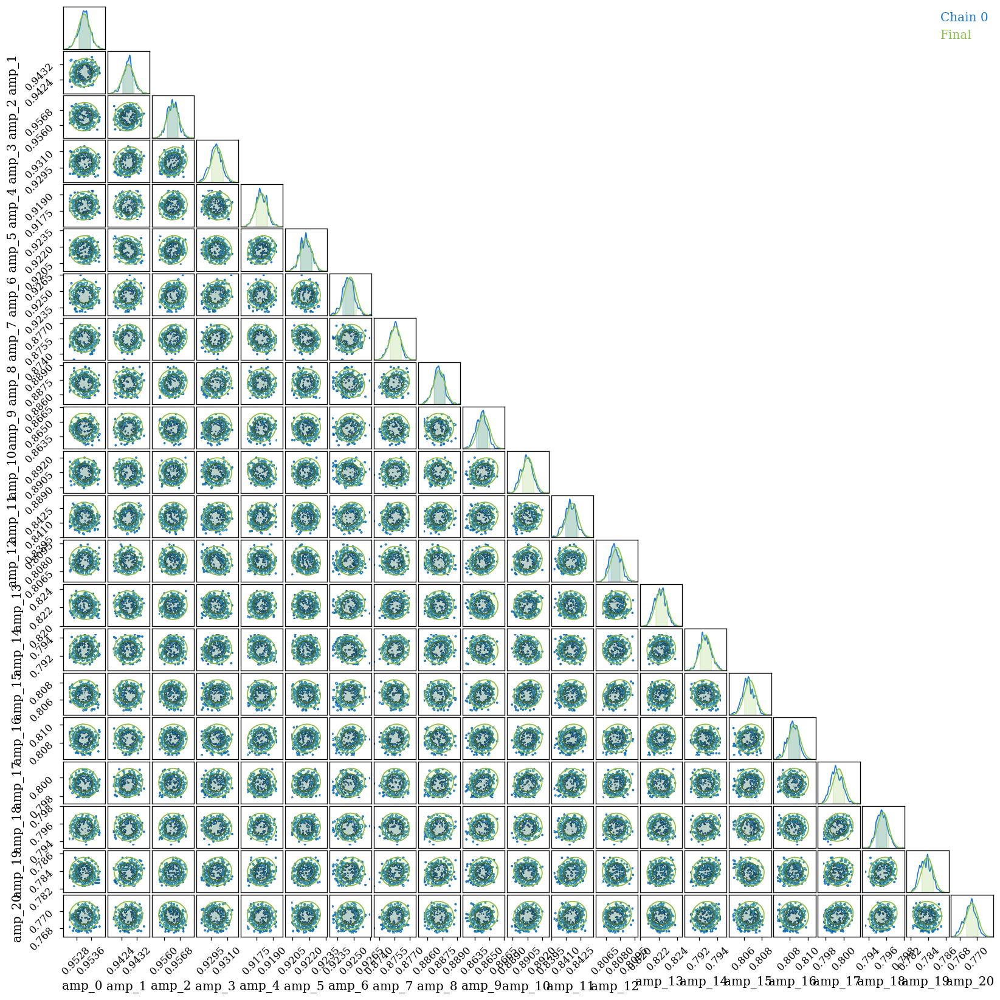

In [ ]:
import chainconsumer as cc

chain = cc.ChainConsumer()
chain.add_chain(new_samples)
chain.add_covariance(MLE, cov, parameters=param_names, name="Final")
chain.configure(
    serif=True, shade=True, bar_shade=True, shade_alpha=0.2, spacing=1.0, max_ticks=3
)

fig = chain.plotter.plot()
fig.set_size_inches((15, 15))